In [1]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import json
import pandas as pd
from scipy.stats import pearsonr

os.chdir("..")
from config import Config

In [2]:
def plot_difference_pred(pred, target, variable_name, **kwargs):
    pred = np.array(pred)
    target = np.array(target)
    #age_corr = pearsonr(target, pred)
    #age_text = 'r = %.3f' % (age_corr[0])
    fig = plt.figure(figsize = (5,5), dpi = 300)
    ax = sns.scatterplot(x = target, y = pred, **kwargs)
    ax.plot([0, 100], [0, 0],'--r', alpha = 0.5)
    if variable_name == 'age':
        ax.set_xlim([0, 100])
        ax.set_ylim([-50, 50])
        ax.set_xlabel('Chronological Age')
        ax.set_ylabel('Sleep Age - Chronological Age')
        #ax.text(2, 40, age_text, fontsize=12)
    elif variable_name == 'bmi':
        ax.set_xlim([10, 70])
        ax.set_ylim([10, 70])
        ax.set_xlabel('True BMI')
        ax.set_ylabel('Sleep BMI')
        ax.text(20, 55, age_text, fontsize=12)
    return fig

In [3]:
def plot_regression_pred(pred, target, variable_name, **kwargs):
    pred = np.array(pred)
    target = np.array(target)
    age_corr = pearsonr(target, pred)
    age_text = 'r = %.3f' % (age_corr[0])
    fig = plt.figure(figsize = (5,5), dpi = 300)
    ax = sns.scatterplot(x = target, y = pred, **kwargs)
    ax.plot([0, 100], [0, 100],'--r', alpha = 0.5)
    if variable_name == 'age':
        ax.set_xlim([0, 100])
        ax.set_ylim([0, 100])
        ax.set_xlabel('Chronological Age')
        ax.set_ylabel('Sleep Age')
        ax.text(2, 80, age_text, fontsize=12)
    elif variable_name == 'bmi':
        ax.set_xlim([10, 70])
        ax.set_ylim([10, 70])
        ax.set_xlabel('True BMI')
        ax.set_ylabel('Sleep BMI')
        ax.text(20, 55, age_text, fontsize=12)
    return fig

In [4]:
# Set up config
config = Config()

In [6]:
# Load predictions
metrics_pre = pd.read_csv(os.path.join(config.model_dir + '_eeg5', 'metrics_pre.csv'))
metrics = pd.read_csv(os.path.join(config.model_dir + '_eeg5', 'metrics.csv'))

In [7]:
# Find cohort of predictions
idx_group = []
idx_group_pre = []
for x in metrics['record']:
    if x[:3] == 'cfs':
        cohort = 'cfs'
    elif x[:4] == 'shhs':
        cohort = 'shhs'
    elif x[-10:-5] == 'Score':
        cohort = 'stages'
    elif x[:4] == 'mros':
        cohort = 'mros'
    elif x[:3] == 'SSC':
        cohort = 'ssc'
    else:
        cohort = 'wsc'
    idx_group.append(cohort)
for x in metrics_pre['record']:
    if x[:3] == 'cfs':
        cohort = 'cfs'
    elif x[:4] == 'shhs':
        cohort = 'shhs'
    elif x[-10:-5] == 'Score':
        cohort = 'stages'
    elif x[:4] == 'mros':
        cohort = 'mros'
    elif x[:3] == 'SSC':
        cohort = 'ssc'
    else:
        cohort = 'wsc'
    idx_group_pre.append(cohort)


In [8]:
# Get l1 loss for each cohort (pre)
l1_stages_pre = np.mean(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'stages' else False for x in idx_group_pre])])
l1_cfs_pre = np.mean(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'cfs' else False for x in idx_group_pre])])
l1_shhs_pre = np.mean(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'shhs' else False for x in idx_group_pre])])
l1_wsc_pre = np.mean(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'wsc' else False for x in idx_group_pre])])
l1_mros_pre = np.mean(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'mros' else False for x in idx_group_pre])])
l1_ssc_pre = np.mean(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'ssc' else False for x in idx_group_pre])])
l1_all_pre = np.mean(metrics_pre['age_l1_loss'])
#print('stages l1 loss (pre): ',l1_stages_pre,'cfs l1 loss (pre): ',l1_cfs_pre,' shhs (pre): ',l1_shhs_pre,'wsc l1 loss (pre): ',l1_wsc_pre,'mros l1 loss (pre): ',l1_mros_pre,' all (pre): ',l1_all_pre)
# Get l1 loss for each cohort
l1_stages = np.mean(np.array(metrics['age_l1_loss'])[np.array([True if x == 'stages' else False for x in idx_group])])
l1_cfs = np.mean(np.array(metrics['age_l1_loss'])[np.array([True if x == 'cfs' else False for x in idx_group])])
l1_shhs = np.mean(np.array(metrics['age_l1_loss'])[np.array([True if x == 'shhs' else False for x in idx_group])])
l1_wsc = np.mean(np.array(metrics['age_l1_loss'])[np.array([True if x == 'wsc' else False for x in idx_group])])
l1_mros = np.mean(np.array(metrics['age_l1_loss'])[np.array([True if x == 'mros' else False for x in idx_group])])
l1_ssc = np.mean(np.array(metrics['age_l1_loss'])[np.array([True if x == 'ssc' else False for x in idx_group])])
l1_all = np.mean(metrics['age_l1_loss'])
#print('stages l1 loss: ',l1_stages,'cfs l1 loss: ',l1_cfs,' shhs: ',l1_shhs,'wsc l1 loss: ',l1_wsc,'mros l1 loss: ',l1_mros,' all: ',l1_all)
# Get l1 2.5 percentile loss for each cohort (pre)
l1_low_stages_pre = np.percentile(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'stages' else False for x in idx_group_pre])], 5)
l1_low_cfs_pre = np.percentile(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'cfs' else False for x in idx_group_pre])], 5)
l1_low_shhs_pre = np.percentile(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'shhs' else False for x in idx_group_pre])], 5)
l1_low_wsc_pre = np.percentile(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'wsc' else False for x in idx_group_pre])], 5)
l1_low_mros_pre = np.percentile(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'mros' else False for x in idx_group_pre])], 5)
l1_low_ssc_pre = np.percentile(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'ssc' else False for x in idx_group_pre])], 5)
l1_low_all_pre = np.percentile(metrics_pre['age_l1_loss'], 5)
#print('stages l1 loss (pre): ',l1_stages_pre,'cfs l1 loss (pre): ',l1_cfs_pre,' shhs (pre): ',l1_shhs_pre,'wsc l1 loss (pre): ',l1_wsc_pre,'mros l1 loss (pre): ',l1_mros_pre,' all (pre): ',l1_all_pre)
# Get l1 loss for each cohort
l1_low_stages = np.percentile(np.array(metrics['age_l1_loss'])[np.array([True if x == 'stages' else False for x in idx_group])], 5)
l1_low_cfs = np.percentile(np.array(metrics['age_l1_loss'])[np.array([True if x == 'cfs' else False for x in idx_group])], 5)
l1_low_shhs = np.percentile(np.array(metrics['age_l1_loss'])[np.array([True if x == 'shhs' else False for x in idx_group])], 5)
l1_low_wsc = np.percentile(np.array(metrics['age_l1_loss'])[np.array([True if x == 'wsc' else False for x in idx_group])], 5)
l1_low_mros = np.percentile(np.array(metrics['age_l1_loss'])[np.array([True if x == 'mros' else False for x in idx_group])], 5)
l1_low_ssc = np.percentile(np.array(metrics['age_l1_loss'])[np.array([True if x == 'ssc' else False for x in idx_group])], 5)
l1_low_all = np.percentile(metrics['age_l1_loss'], 5)
# Get l1 loss for each cohort (pre)
l1_high_stages_pre = np.percentile(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'stages' else False for x in idx_group_pre])], 95)
l1_high_cfs_pre = np.percentile(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'cfs' else False for x in idx_group_pre])], 95)
l1_high_shhs_pre = np.percentile(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'shhs' else False for x in idx_group_pre])], 95)
l1_high_wsc_pre = np.percentile(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'wsc' else False for x in idx_group_pre])], 95)
l1_high_mros_pre = np.percentile(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'mros' else False for x in idx_group_pre])], 95)
l1_high_ssc_pre = np.percentile(np.array(metrics_pre['age_l1_loss'])[np.array([True if x == 'ssc' else False for x in idx_group_pre])], 95)
l1_high_all_pre = np.percentile(metrics_pre['age_l1_loss'], 95)
#print('stages l1 loss (pre): ',l1_stages_pre,'cfs l1 loss (pre): ',l1_cfs_pre,' shhs (pre): ',l1_shhs_pre,'wsc l1 loss (pre): ',l1_wsc_pre,'mros l1 loss (pre): ',l1_mros_pre,' all (pre): ',l1_all_pre)
# Get l1 loss for each cohort
l1_high_stages = np.percentile(np.array(metrics['age_l1_loss'])[np.array([True if x == 'stages' else False for x in idx_group])], 95)
l1_high_cfs = np.percentile(np.array(metrics['age_l1_loss'])[np.array([True if x == 'cfs' else False for x in idx_group])], 95)
l1_high_shhs = np.percentile(np.array(metrics['age_l1_loss'])[np.array([True if x == 'shhs' else False for x in idx_group])], 95)
l1_high_wsc = np.percentile(np.array(metrics['age_l1_loss'])[np.array([True if x == 'wsc' else False for x in idx_group])], 95)
l1_high_mros = np.percentile(np.array(metrics['age_l1_loss'])[np.array([True if x == 'mros' else False for x in idx_group])], 95)
l1_high_ssc = np.percentile(np.array(metrics['age_l1_loss'])[np.array([True if x == 'ssc' else False for x in idx_group])], 95)
l1_high_all = np.percentile(metrics['age_l1_loss'], 95)

In [9]:
# TODO: base error should be conisdered from average of training set
avg_cfs = 37.902
avg_shhs = 68.814
avg_wsc = 58.667
avg_ssc = 44.757
avg_stages = 41.973
avg_mros = 81.321
avg_all = 52.695
# mean
base_err_all = np.mean(np.abs((metrics['age'])-avg_all))
base_err_stages = np.mean(np.abs((metrics['age'][np.array([True if x == 'stages' else False for x in idx_group])])-avg_stages))
base_err_cfs = np.mean(np.abs((metrics['age'][np.array([True if x == 'cfs' else False for x in idx_group])])-avg_cfs))
base_err_shhs = np.mean(np.abs((metrics['age'][np.array([True if x == 'shhs' else False for x in idx_group])])-avg_shhs))
base_err_wsc = np.mean(np.abs((metrics['age'][np.array([True if x == 'wsc' else False for x in idx_group])])-avg_wsc))
base_err_mros = np.mean(np.abs((metrics['age'][np.array([True if x == 'mros' else False for x in idx_group])])-avg_mros))
base_err_ssc = np.mean(np.abs((metrics['age'][np.array([True if x == 'ssc' else False for x in idx_group])])-avg_ssc))
# low
base_low_err_all = np.percentile(np.abs((metrics['age'])-avg_all), 5)
base_low_err_stages = np.percentile(np.abs((metrics['age'][np.array([True if x == 'stages' else False for x in idx_group])])-avg_stages), 5)
base_low_err_cfs = np.percentile(np.abs((metrics['age'][np.array([True if x == 'cfs' else False for x in idx_group])])-avg_cfs), 5)
base_low_err_shhs = np.percentile(np.abs((metrics['age'][np.array([True if x == 'shhs' else False for x in idx_group])])-avg_shhs), 5)
base_low_err_wsc = np.percentile(np.abs((metrics['age'][np.array([True if x == 'wsc' else False for x in idx_group])])-avg_wsc), 5)
base_low_err_mros = np.percentile(np.abs((metrics['age'][np.array([True if x == 'mros' else False for x in idx_group])])-avg_mros), 5)
base_low_err_ssc = np.percentile(np.abs((metrics['age'][np.array([True if x == 'ssc' else False for x in idx_group])])-avg_ssc), 5)
# high
base_high_err_all = np.percentile(np.abs((metrics['age'])-avg_all), 95)
base_high_err_stages = np.percentile(np.abs((metrics['age'][np.array([True if x == 'stages' else False for x in idx_group])])-avg_stages), 95)
base_high_err_cfs = np.percentile(np.abs((metrics['age'][np.array([True if x == 'cfs' else False for x in idx_group])])-avg_cfs), 95)
base_high_err_shhs = np.percentile(np.abs((metrics['age'][np.array([True if x == 'shhs' else False for x in idx_group])])-avg_shhs), 95)
base_high_err_wsc = np.percentile(np.abs((metrics['age'][np.array([True if x == 'wsc' else False for x in idx_group])])-avg_wsc), 95)
base_high_err_mros = np.percentile(np.abs((metrics['age'][np.array([True if x == 'mros' else False for x in idx_group])])-avg_mros), 95)
base_high_err_ssc = np.percentile(np.abs((metrics['age'][np.array([True if x == 'ssc' else False for x in idx_group])])-avg_ssc), 95)

#print(base_err_all,base_err_stages,base_err_cfs,base_err_shhs,base_err_wsc,base_err_mros)

In [10]:
print('Performance\tpre\tfull\tguess')
print('Stages:\t{:.3f}, [{:.3f}, {:.3f}]\t{:.3f}, [{:.3f}, {:.3f}]\t{:.3f}, [{:.3f}, {:.3f}]'.format(l1_stages_pre, l1_low_stages_pre, l1_high_stages_pre, l1_stages, l1_low_stages, l1_high_stages, base_err_stages, base_low_err_stages, base_high_err_stages))
print('CFS:\t{:.3f}, [{:.3f}, {:.3f}]\t{:.3f}, [{:.3f}, {:.3f}]\t{:.3f}, [{:.3f}, {:.3f}]'.format(l1_cfs_pre, l1_low_cfs_pre, l1_high_cfs_pre, l1_cfs, l1_low_cfs, l1_high_cfs, base_err_cfs, base_low_err_cfs, base_high_err_cfs))
print('SHHS:\t{:.3f}, [{:.3f}, {:.3f}]\t{:.3f}, [{:.3f}, {:.3f}]\t{:.3f}, [{:.3f}, {:.3f}]'.format(l1_shhs_pre, l1_low_shhs_pre, l1_high_shhs_pre, l1_shhs, l1_low_shhs, l1_high_shhs, base_err_shhs, base_low_err_shhs, base_high_err_shhs))
print('WSC:\t{:.3f}, [{:.3f}, {:.3f}]\t{:.3f}, [{:.3f}, {:.3f}]\t{:.3f}, [{:.3f}, {:.3f}]'.format(l1_wsc_pre, l1_low_wsc_pre, l1_high_wsc_pre, l1_wsc, l1_low_wsc, l1_high_wsc, base_err_wsc, base_low_err_wsc, base_high_err_wsc))
print('SSC:\t{:.3f}, [{:.3f}, {:.3f}]\t{:.3f}, [{:.3f}, {:.3f}]\t{:.3f}, [{:.3f}, {:.3f}]'.format(l1_ssc_pre, l1_low_ssc_pre, l1_high_ssc_pre, l1_ssc, l1_low_ssc, l1_high_ssc, base_err_ssc, base_low_err_ssc, base_high_err_ssc))
print('MrOS:\t{:.3f}, [{:.3f}, {:.3f}]\t{:.3f}, [{:.3f}, {:.3f}]\t{:.3f}, [{:.3f}, {:.3f}]'.format(l1_mros_pre, l1_low_mros_pre, l1_high_mros_pre, l1_mros, l1_low_mros, l1_high_mros, base_err_mros, base_low_err_mros, base_high_err_mros))
print('All:\t{:.3f}, [{:.3f}, {:.3f}]\t{:.3f}, [{:.3f}, {:.3f}]\t{:.3f}, [{:.3f}, {:.3f}]'.format(l1_all_pre, l1_low_all_pre, l1_high_all_pre, l1_all, l1_low_all, l1_high_all, base_err_all, base_low_err_all, base_high_err_all))

Performance	pre	full	guess
Stages:	8.027, [0.492, 20.277]	8.387, [0.551, 21.142]	11.084, [0.973, 26.027]
CFS:	8.235, [0.391, 18.943]	9.219, [1.054, 21.946]	14.027, [4.459, 33.471]
SHHS:	7.068, [0.544, 17.831]	8.779, [0.603, 22.172]	9.930, [0.814, 24.814]
WSC:	5.040, [0.401, 11.981]	6.328, [0.498, 15.441]	6.272, [0.757, 14.198]
SSC:	5.813, [0.329, 14.984]	7.208, [0.375, 17.406]	6.760, [0.640, 21.860]
MrOS:	5.811, [0.443, 16.106]	6.920, [0.449, 15.312]	6.464, [0.679, 12.321]
All:	6.541, [0.472, 17.115]	7.904, [0.524, 20.141]	13.740, [1.305, 28.305]


In [11]:
# EM: Overall percentile error (non-abs)
SAI_low_pre = np.percentile(metrics_pre['age_p']-metrics_pre['age'], 5)
SAI_high_pre = np.percentile(metrics_pre['age_p']-metrics_pre['age'], 95)
SAI_low = np.percentile(metrics['age_p']-metrics['age'], 5)
SAI_high = np.percentile(metrics['age_p']-metrics['age'], 95)
SAI_low_base = np.percentile(avg_all-metrics['age'], 5)
SAI_high_base = np.percentile(avg_all-metrics['age'], 95)

print('{:.2f}, {:.2f}'.format(SAI_low_pre, SAI_high_pre))
print('{:.2f}, {:.2f}'.format(SAI_low, SAI_high))
print('{:.2f}, {:.2f}'.format(SAI_low_base, SAI_high_base))

-13.19, 14.34
-15.42, 16.71
-28.30, 10.70


In [12]:
cov_dif_age = (np.cov(metrics['age_p']-metrics['age'], metrics['age']))
cor_dif_age = (pearsonr(metrics['age_p']-metrics['age'], metrics['age']))[0]
print(cov_dif_age,cor_dif_age)

[[100.07662615 -12.37514925]
 [-12.37514925 153.70618969]] -0.09977883737559372


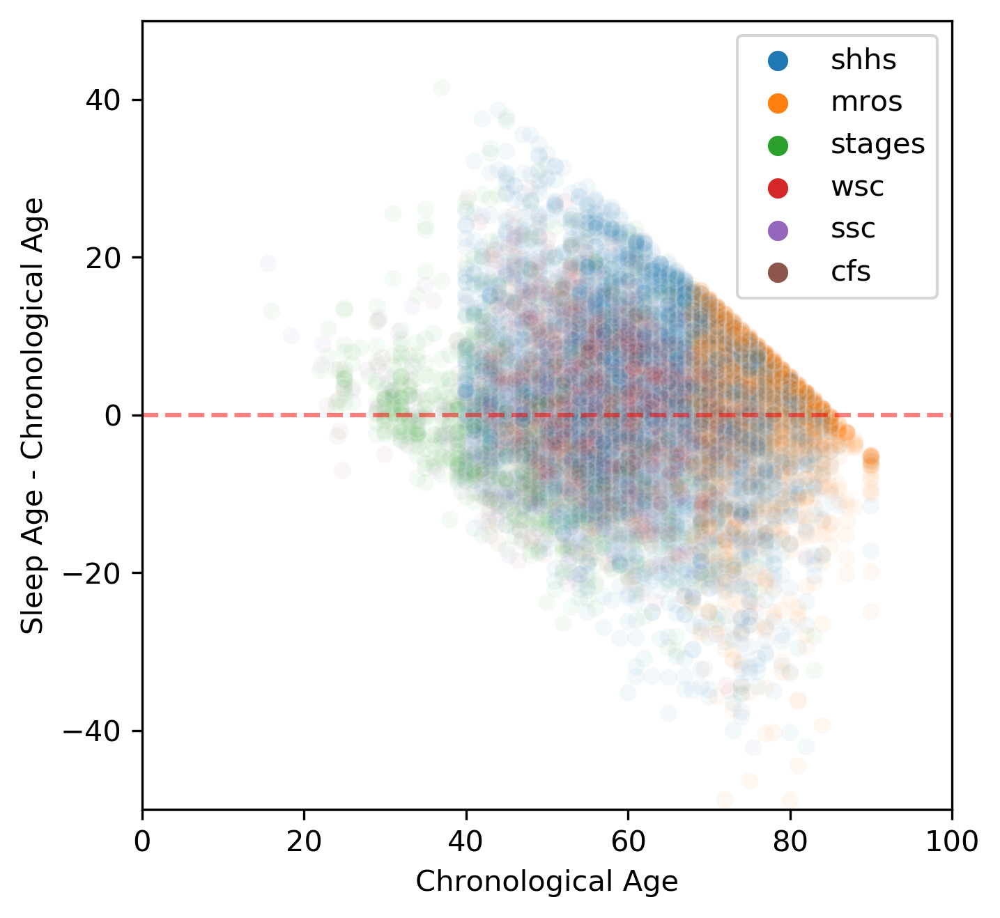

In [13]:
fig = plot_difference_pred(metrics['age_p']-metrics['age'], metrics['age'], 'age', 
                    hue = idx_group, 
                    alpha = 0.05,
                    markers = {'cfs': 'o','shhs': 'o','wsc': 'o', 'stages': 'o', 'ssc': 'o', 'mros': 'o'})

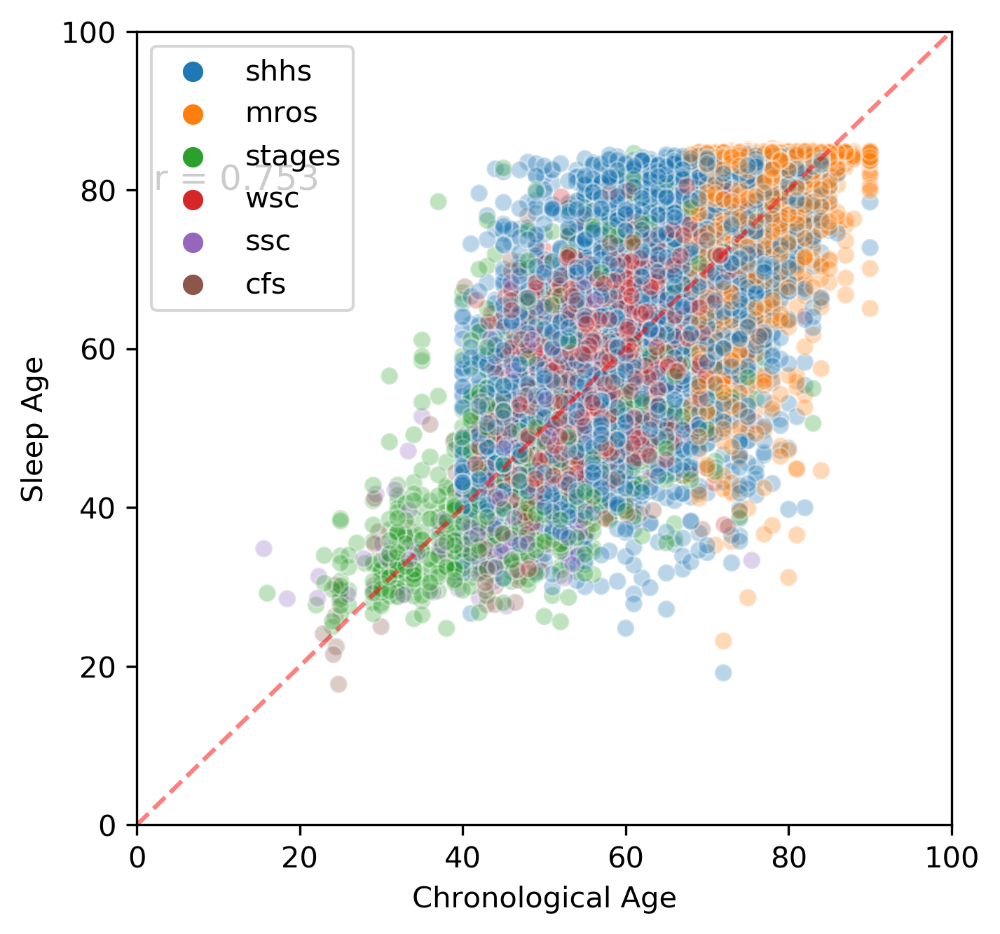

In [14]:
fig = plot_regression_pred(metrics['age_p'], metrics['age'], 'age', 
                    hue = idx_group, 
                    alpha = 0.3,
                    markers = {'cfs': 'o','shhs': 'o','wsc': 'o', 'stages': 'o', 'ssc': 'o', 'mros': 'o'})

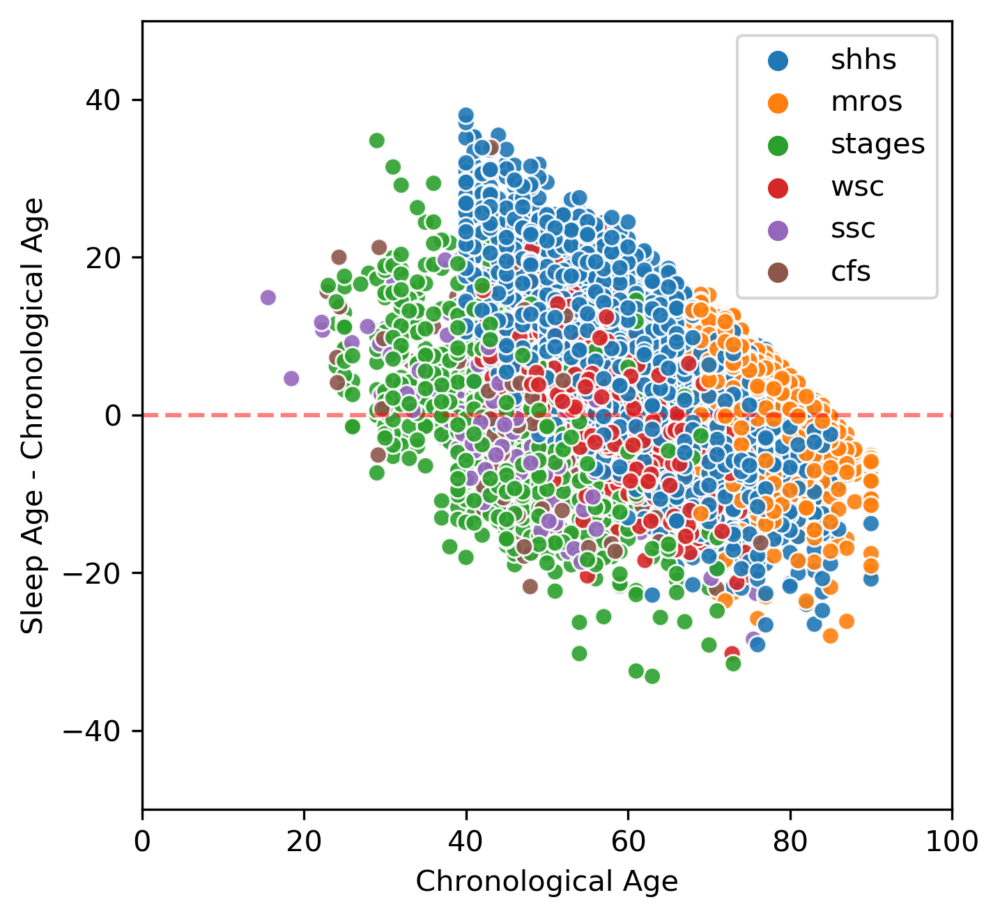

In [11]:
fig = plot_difference_pred(metrics_pre['age_p']-metrics_pre['age'], metrics_pre['age'], 'age', 
                    hue = idx_group, 
                    alpha = 0.9,
                    markers = {'cfs': 'o','shhs': 'o','wsc': 'o', 'stages': 'o', 'ssc': 'o', 'mros': 'o'})

In [12]:
print(idx_group.count('mros'))

54


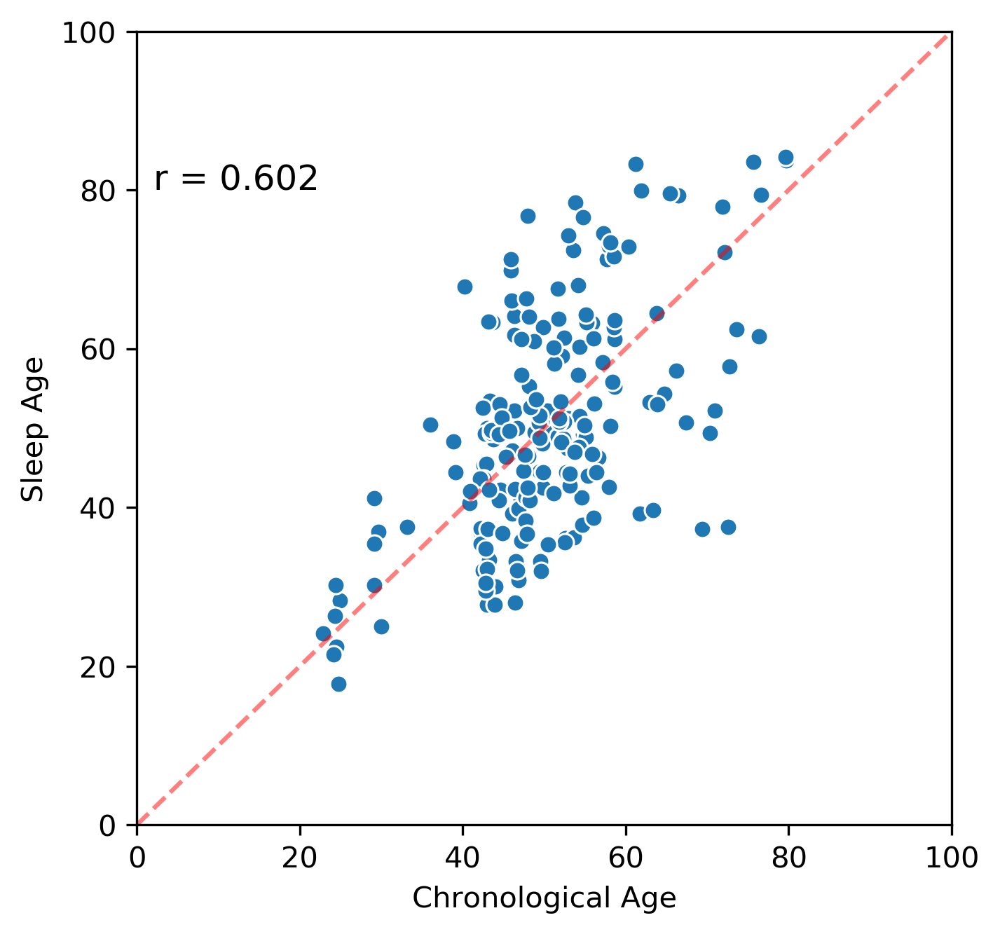

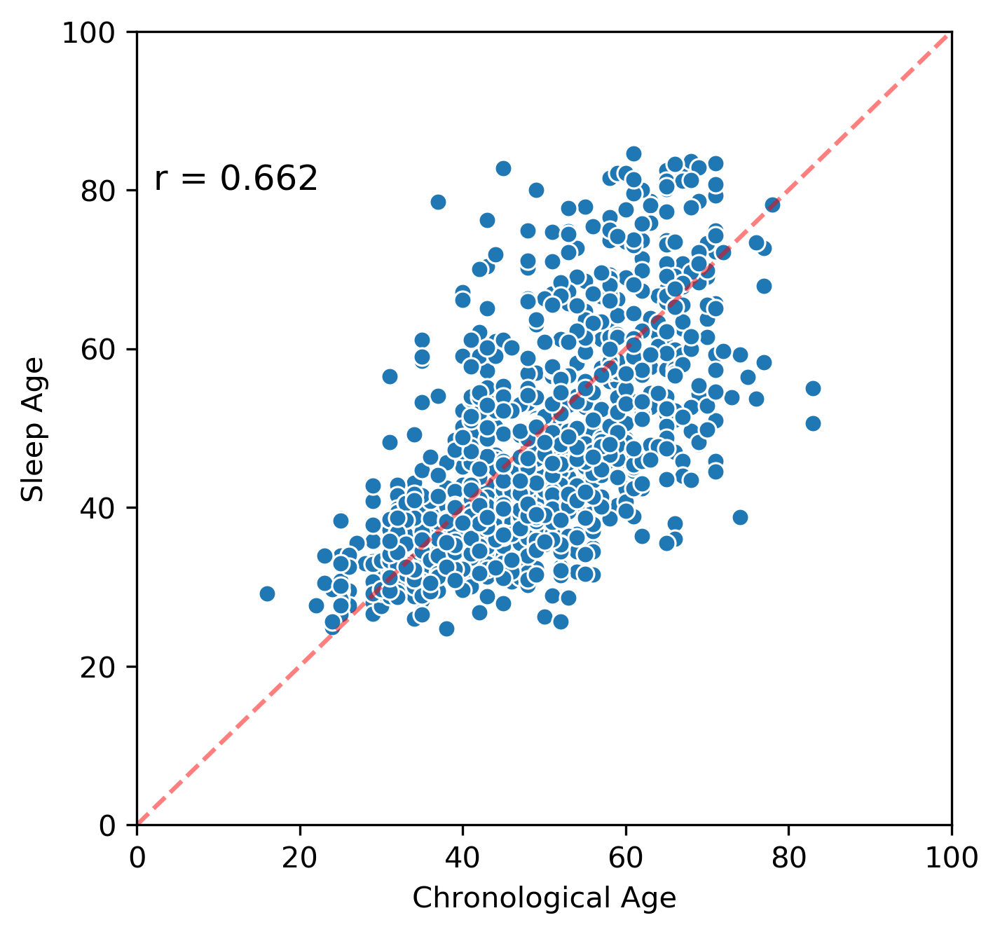

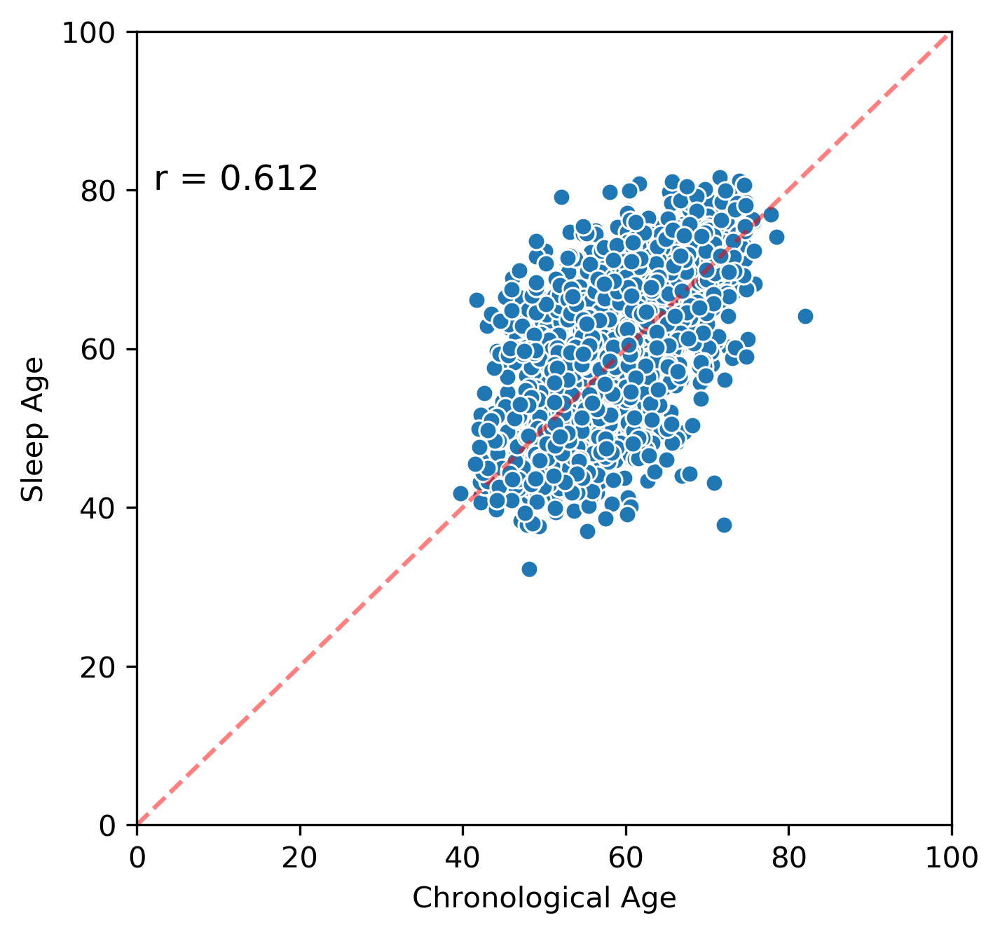

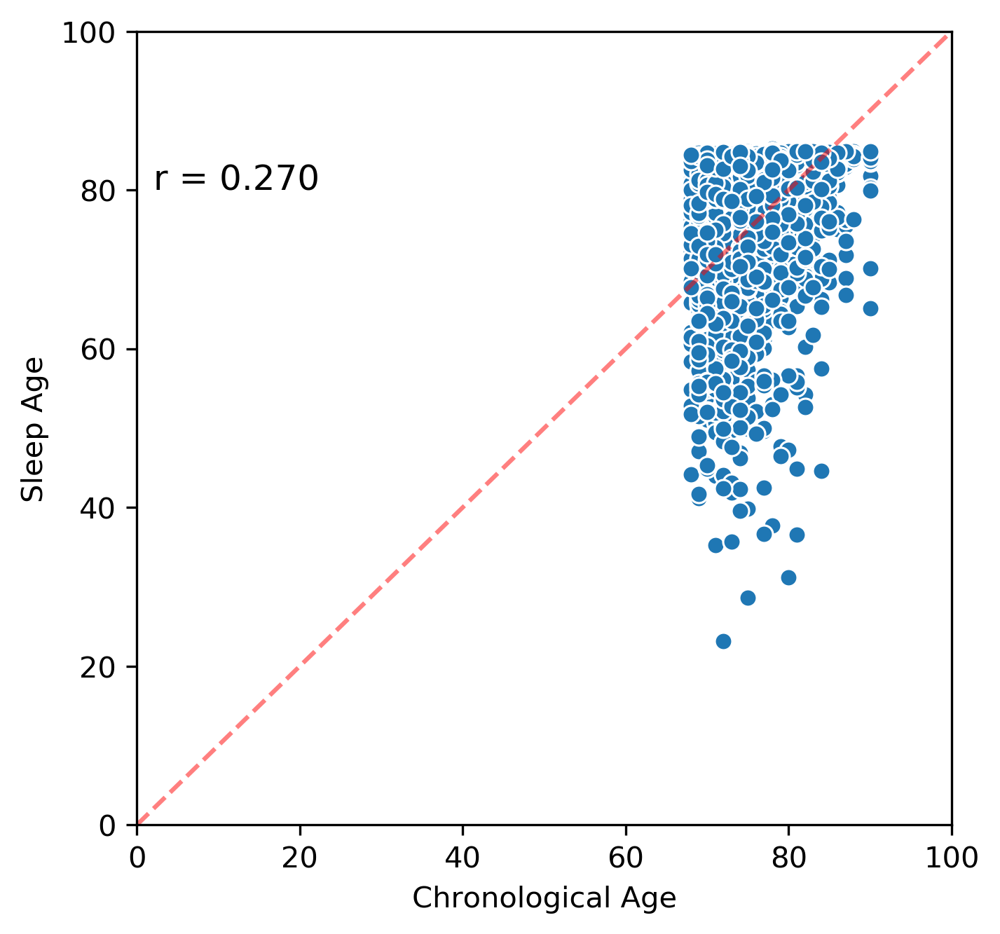

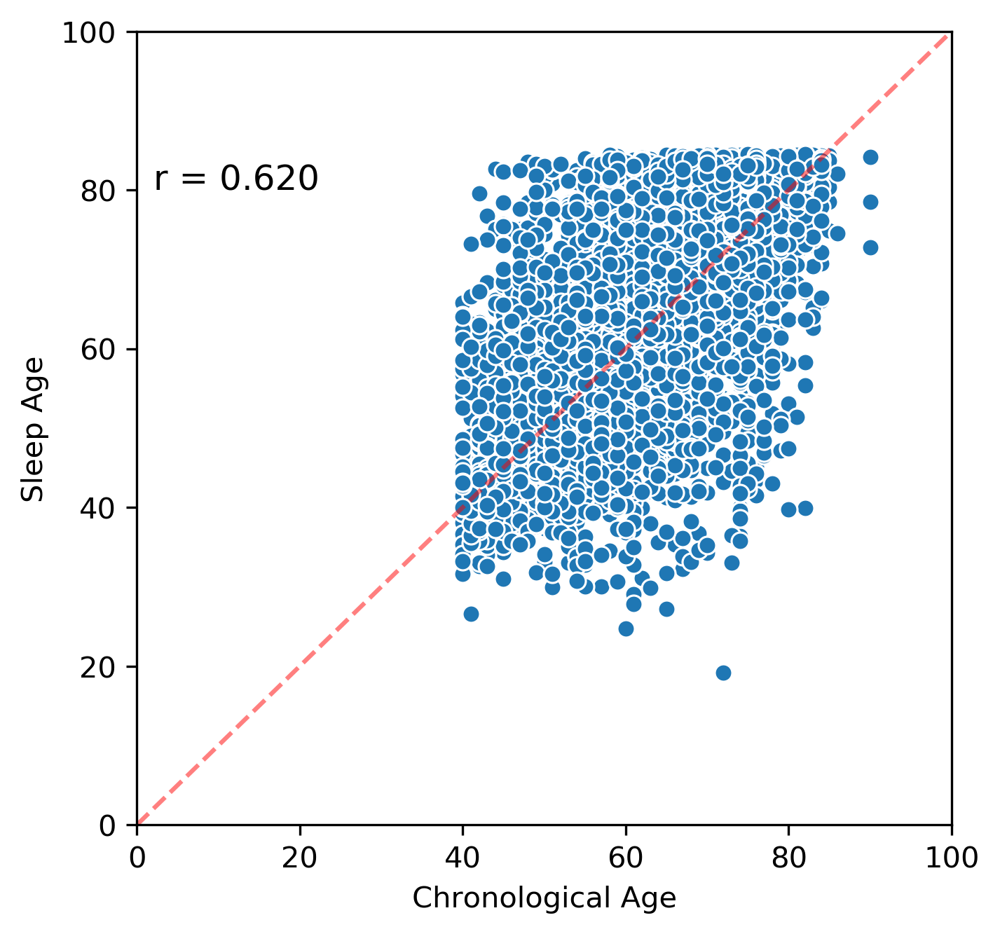

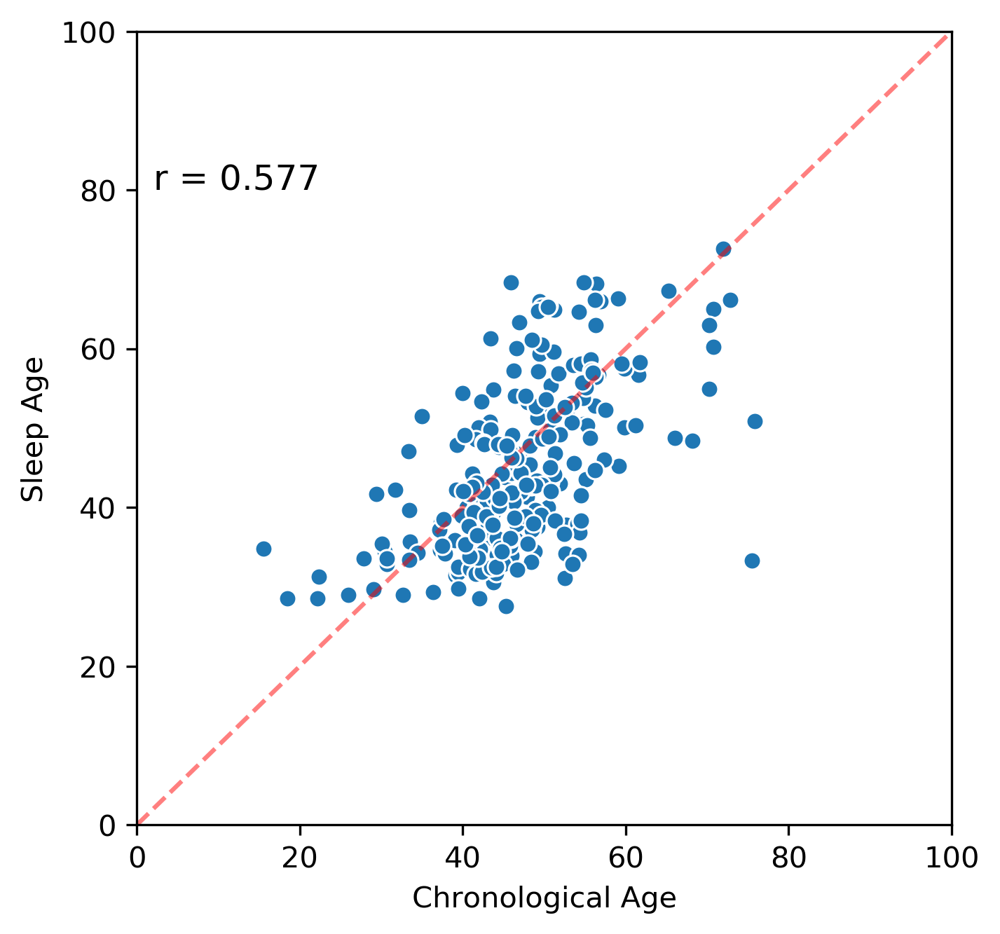

In [15]:
# CFS
fig = plot_regression_pred([metrics['age_p'][i] for i, x in enumerate(idx_group) if x == 'cfs'], [metrics['age'][i] for i, x in enumerate(idx_group) if x == 'cfs'], 'age')
# STAGES
fig = plot_regression_pred([metrics['age_p'][i] for i, x in enumerate(idx_group) if x == 'stages'], [metrics['age'][i] for i, x in enumerate(idx_group) if x == 'stages'], 'age')
# WSC
fig = plot_regression_pred([metrics['age_p'][i] for i, x in enumerate(idx_group) if x == 'wsc'], [metrics['age'][i] for i, x in enumerate(idx_group) if x == 'wsc'], 'age')
# mros
fig = plot_regression_pred([metrics['age_p'][i] for i, x in enumerate(idx_group) if x == 'mros'], [metrics['age'][i] for i, x in enumerate(idx_group) if x == 'mros'], 'age')
# SHHS
fig = plot_regression_pred([metrics['age_p'][i] for i, x in enumerate(idx_group) if x == 'shhs'], [metrics['age'][i] for i, x in enumerate(idx_group) if x == 'shhs'], 'age')
# SSC
fig = plot_regression_pred([metrics['age_p'][i] for i, x in enumerate(idx_group) if x == 'ssc'], [metrics['age'][i] for i, x in enumerate(idx_group) if x == 'ssc'], 'age')

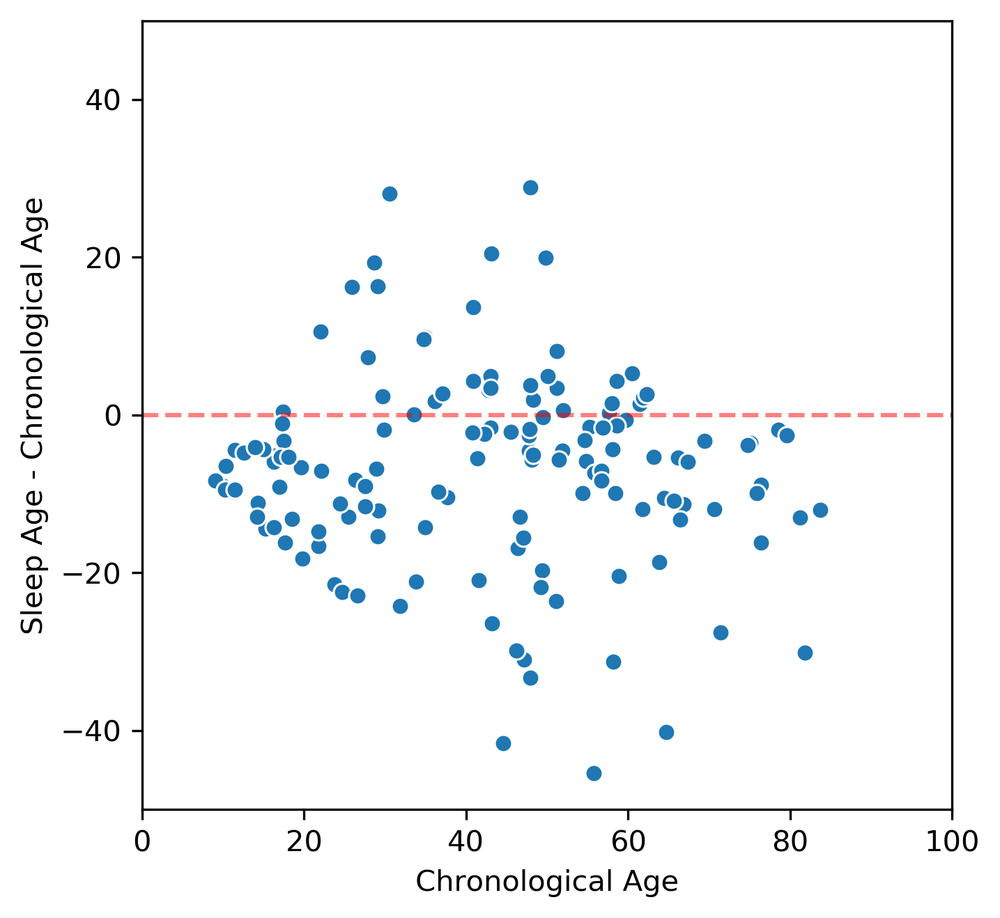

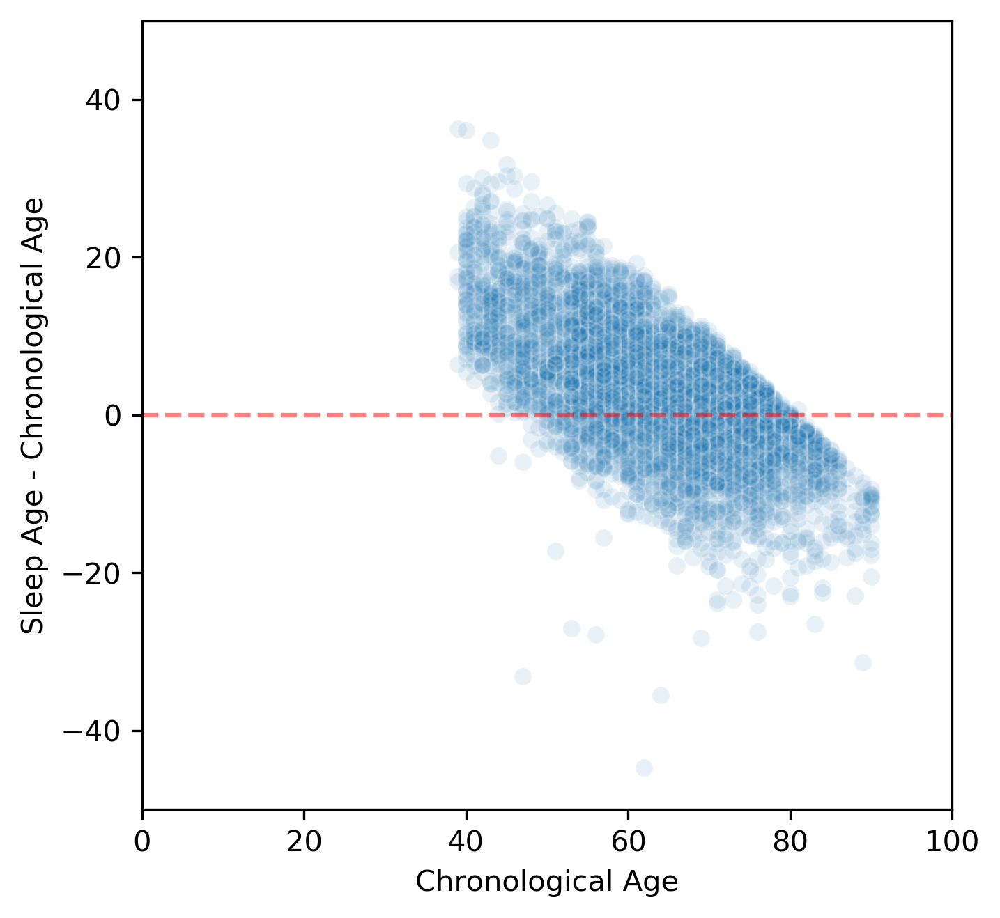

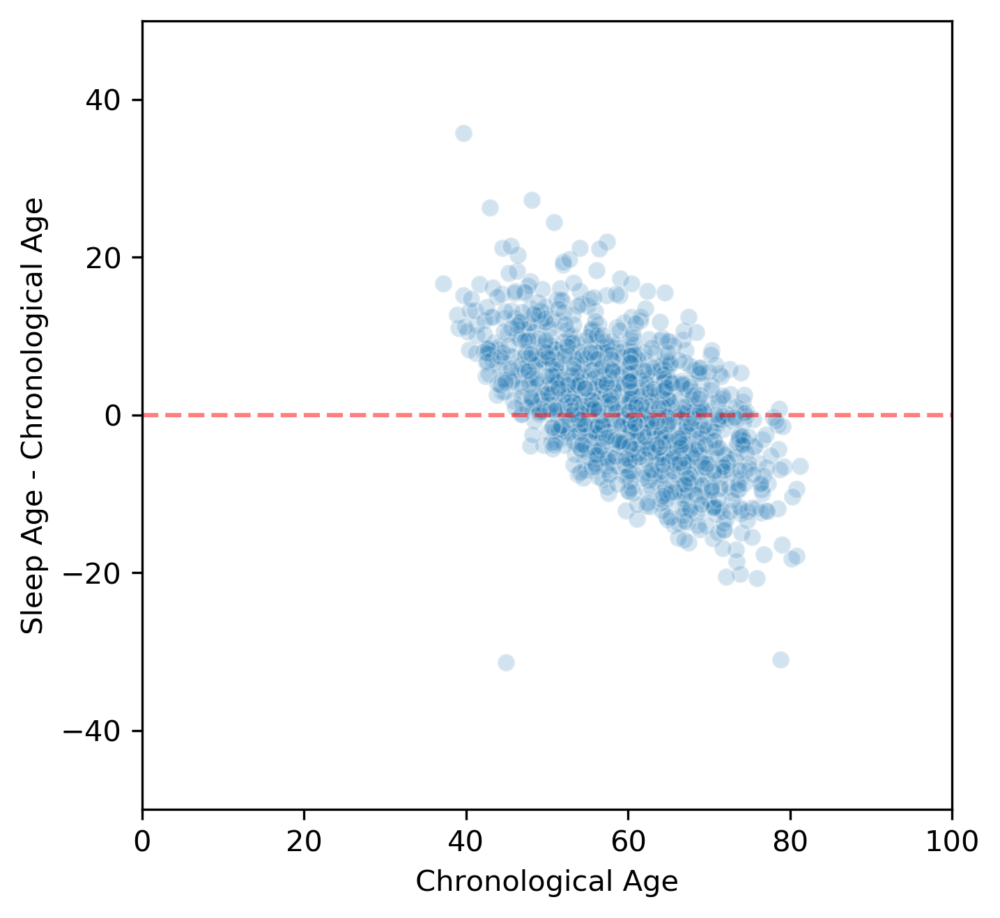

In [16]:
# CFS
fig = plot_difference_pred([metrics['age_p'][i]-metrics['age'][i] for i, x in enumerate(idx_group) if x == 'cfs'], [metrics['age'][i] for i, x in enumerate(idx_group) if x == 'cfs'], 'age', alpha = 1.0)
# SHHS
fig = plot_difference_pred([metrics['age_p'][i]-metrics['age'][i] for i, x in enumerate(idx_group) if x == 'shhs'], [metrics['age'][i] for i, x in enumerate(idx_group) if x == 'shhs'], 'age', alpha = 0.1)
# WSC
fig = plot_difference_pred([metrics['age_p'][i]-metrics['age'][i] for i, x in enumerate(idx_group) if x == 'wsc'], [metrics['age'][i] for i, x in enumerate(idx_group) if x == 'wsc'], 'age', alpha = 0.2)